# Final Term Project : Gen-Z Social Media Addiction Analysis

In [1]:
# Import the necessary libraries
import kagglehub # For downloading datasets from Kaggle
# Data manipulation
import os
import pandas as pd
import numpy as np
# Data visualization
import matplotlib.pyplot as plt
# Statistical analysis (chi-square and ANOVA tests)
from scipy.stats import chi2_contingency, f_oneway

f:\Projects\Gen-Z-Social-Media-Addiction-Analysis\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Download the dataset and get the path to the dataset files
file_path = kagglehub.dataset_download("sharmajicoder/gen-z-social-media-usage-dataset")
print("Dataset downloaded successfully.")
print("File path:", file_path)

Dataset downloaded successfully.
File path: C:\Users\unknown\.cache\kagglehub\datasets\sharmajicoder\gen-z-social-media-usage-dataset\versions\1


In [3]:
# Check if the file path exists and locate the dataset file
if os.path.exists(file_path):
    file_name = os.listdir(file_path)[0]
    
    print("Dataset file found at the specified path.")
    print("File name:", file_name)
    
    full_path = os.path.join(file_path, file_name)
    print("Full path to dataset file:", full_path)
    
    if os.path.isfile(full_path) and full_path.endswith('.csv'):
        print("Dataset file found at the specified path.")
        # Load the dataset
        df = pd.read_csv(full_path)    
        print("Dataset file loaded successfully.")
    else:
        print("Dataset file not found or is not a CSV file at the specified path.")
else:
    print("Dataset file path does not exist at the specified path.")

Dataset file found at the specified path.
File name: genz_social_media_usage_1M.csv
Full path to dataset file: C:\Users\unknown\.cache\kagglehub\datasets\sharmajicoder\gen-z-social-media-usage-dataset\versions\1\genz_social_media_usage_1M.csv
Dataset file found at the specified path.
Dataset file loaded successfully.


In [4]:
# Check and display the dataset information
print("Dataset shape: (Rows, Columns) =", df.shape)
print("- This dataset contains", df.shape[0], "rows and", df.shape[1], "columns.")
print("Dataset columns: \n", df.columns.tolist())
print("First 5 rows of the dataset: \n", df.head())
# Data types and missing values
print("Data types: \n", df.dtypes)
print("Missing values: \n", df.isnull().sum(), "rows have missing values.")
# Summary statistics of the dataset
print("Summary statistics: \n", df.describe())

Dataset shape: (Rows, Columns) = (1000000, 12)
- This dataset contains 1000000 rows and 12 columns.
Dataset columns: 
 ['age', 'gender', 'country', 'daily_usage_hours', 'primary_platform', 'num_platforms_used', 'purpose', 'avg_session_minutes', 'night_usage', 'mental_health_score', 'addiction_level', 'screen_time_before_sleep']
First 5 rows of the dataset: 
    age  gender    country  daily_usage_hours primary_platform  \
0   19    Male  Australia           2.658617         Snapchat   
1   16  Female        USA           5.685387          Twitter   
2   25  Female      India           2.782420           TikTok   
3   27    Male      India           3.486598          YouTube   
4   23  Female      India           3.748829           TikTok   

   num_platforms_used        purpose  avg_session_minutes  night_usage  \
0                   4      Education            29.222443            0   
1                   3    Socializing            32.464726            1   
2                   2    S

In [5]:
# Data Cleaning
duplicates = df.duplicated().sum()
print("Number of duplicate rows:", duplicates)

if duplicates > 0:
    df = df.drop_duplicates()
    print("Duplicate rows removed. New dataset shape:", df.shape)
print("Number of duplicate rows after removal:", len(df))

Number of duplicate rows: 0
Number of duplicate rows after removal: 1000000


In [6]:
# Checking for impossible values in the dataset
age_dimension_mask = (df['age'] < 18) | (df['age'] > 25)
gender_dimension_mask = ~df['gender'].isin(['Male', 'Female'])
daily_usage_hours_dimension_mask = (df['daily_usage_hours'] < 0) | (df['daily_usage_hours'] > 24)
avg_session_minutes_dimension_mask = (df['avg_session_minutes'] < 0) | (df['avg_session_minutes'] > 24 * 60)
night_usage_dimension_mask = ~df['night_usage'].isin([0, 1])
mental_health_score_dimension_mask = (df['mental_health_score'] < 0) | (df['mental_health_score'] > 10)
addiction_level_dimension_mask = ~df['addiction_level'].isin(['Low', 'Medium', 'High'])

invalid_dimension_mask = (
    age_dimension_mask |
    gender_dimension_mask |
    daily_usage_hours_dimension_mask |
    avg_session_minutes_dimension_mask |
    night_usage_dimension_mask |
    mental_health_score_dimension_mask |
    addiction_level_dimension_mask
)

invalid_dimension_count = invalid_dimension_mask.sum()
print("Number of rows with invalid values:", invalid_dimension_count)
'''
Keeping only valid rows in the dataset based on the defined criteria for each dimension:
age => 18-25
gender => 'Male' or 'Female'
daily usage => 0-24 hours
average session => 0-1440 minutes
night usage => 0-1
mental health score => 0-10
addiction level => 'Low'-'Medium'-'High'
'''
if invalid_dimension_count > 0:
    df = df[~invalid_dimension_mask]
    print("Invalid rows removed. New dataset shape: (Rows, Columns) =", df.shape)
else:
    print("No invalid values found in the dataset.")

Number of rows with invalid values: 488892
Invalid rows removed. New dataset shape: (Rows, Columns) = (511108, 12)


In [7]:
# Percentile based trimming for removing extreme outliers
df_before_trim = df.copy()

daily_usage_hours_low, daily_usage_hours_high = np.percentile(df['daily_usage_hours'], [5, 95])
avg_session_minutes_low, avg_session_minutes_high = np.percentile(df['avg_session_minutes'], [5, 95])
screen_time_before_sleep_low, screen_time_before_sleep_high = np.percentile(df['screen_time_before_sleep'], [5, 95])

trim_mask = (
    (df['daily_usage_hours'] >= daily_usage_hours_low) & (df['daily_usage_hours'] <= daily_usage_hours_high) &
    (df['avg_session_minutes'] >= avg_session_minutes_low) & (df['avg_session_minutes'] <= avg_session_minutes_high) &
    (df['screen_time_before_sleep'] >= screen_time_before_sleep_low) & (df['screen_time_before_sleep'] <= screen_time_before_sleep_high)
)

df = df[trim_mask].copy()
print("Dataset shape after trimming: (Rows, Columns) =", df.shape)
print("Number of rows removed by trimming:", len(df_before_trim) - len(df))

Dataset shape after trimming: (Rows, Columns) = (372565, 12)
Number of rows removed by trimming: 138543


In [8]:
# Feature Engineering Code
platform_map = {'Low': 1, 'Medium': 2, 'High': 3}
df['addiction_number'] = df['addiction_level'].map(platform_map)
df['usage_intensity'] = df['daily_usage_hours'] / df['num_platforms_used']
df['addiction_risk'] = df['addiction_number'] * (df['night_usage'] + 1)

base_score = df['addiction_number'] * 1.5
extra_weight = np.where(df['night_usage'] == 'Yes', 2, 1)
df['addiction_risk_score'] = base_score + extra_weight

print(df.head(5))

   age  gender    country  daily_usage_hours primary_platform  \
0   19    Male  Australia           2.658617         Snapchat   
2   25  Female      India           2.782420           TikTok   
4   23  Female      India           3.748829           TikTok   
6   25    Male    Germany           5.241584           TikTok   
8   19  Female     Brazil           2.782067          Twitter   

   num_platforms_used        purpose  avg_session_minutes  night_usage  \
0                   4      Education            29.222443            0   
2                   2    Socializing            18.170204            1   
4                   1  Entertainment            27.358410            1   
6                   1  Entertainment            31.179369            1   
8                   2    Socializing            27.580314            1   

   mental_health_score addiction_level  screen_time_before_sleep  \
0             6.705830          Medium                 15.779443   
2             6.035397      

In [9]:
# Average daily usage hours by mental health score
print("Average daily usage hours by mental health score: \n")
print("Mental Health Score\tAverage Daily Usage Hours")
print("-" * 20 + "\t" + "-" * 20)
for score, avg_hours in df.groupby('mental_health_score')['daily_usage_hours'].mean().items():
    print(f"\t{score:.2f}\t\t\t{avg_hours:.2f}")

Average daily usage hours by mental health score: 

Mental Health Score	Average Daily Usage Hours
--------------------	--------------------
	1.16			5.50
	1.63			5.73
	1.67			5.89
	1.98			5.67
	1.99			5.53
	2.00			4.70
	2.06			5.76
	2.09			5.16
	2.10			5.44
	2.11			5.93
	2.13			5.75
	2.15			5.42
	2.15			5.44
	2.15			3.45
	2.19			5.95
	2.20			5.81
	2.20			5.48
	2.26			5.64
	2.27			5.14
	2.28			5.91
	2.29			5.58
	2.30			5.88
	2.30			5.01
	2.34			5.75
	2.35			5.76
	2.35			5.62
	2.38			5.17
	2.38			5.83
	2.39			5.74
	2.40			5.62
	2.40			5.70
	2.41			5.70
	2.42			5.60
	2.43			5.55
	2.43			5.78
	2.44			5.70
	2.44			5.88
	2.45			5.80
	2.45			5.86
	2.45			5.30
	2.46			5.82
	2.47			5.47
	2.48			5.57
	2.49			5.22
	2.49			5.23
	2.49			5.29
	2.49			5.62
	2.50			5.87
	2.50			5.68
	2.50			5.87
	2.50			5.93
	2.51			5.95
	2.53			5.80
	2.54			4.11
	2.55			5.25
	2.55			5.81
	2.55			5.51
	2.57			4.81
	2.57			5.94
	2.57			4.53
	2.57			5.63
	2.57			5.92
	2.58			5.92
	2.58			5.49
	2.59			5.92
	2.59			5.59
	2

In [10]:
#  Average Screen Time Before Sleep by Addiction Level
subgroup_addiction = df.groupby('addiction_level')['screen_time_before_sleep'].mean().sort_values(ascending=False)
print("\nSubgroup Comparison: Average Screen Time Before Sleep by Addiction Level")
print(subgroup_addiction)

#  Top primary platforms by gender
platform_gender_freq = df.groupby(['gender', 'primary_platform']).size().unstack()
print("\nFrequency Analysis: Platform preference by gender")
print(platform_gender_freq)

#  Ranking: Top 5 countries with the highest average daily usage
top_countries_usage = df.groupby('country')['daily_usage_hours'].mean().nlargest(5)
print("\nRanking: Top 5 Countries by Average Daily Usage")
print(top_countries_usage)


Subgroup Comparison: Average Screen Time Before Sleep by Addiction Level
addiction_level
Low       40.006095
Medium    39.960737
High      39.848351
Name: screen_time_before_sleep, dtype: float64

Frequency Analysis: Platform preference by gender
primary_platform  Instagram  Snapchat  TikTok  Twitter  YouTube
gender                                                         
Female                55795     18633   46480    18589    46823
Male                  56024     18685   46392    18596    46548

Ranking: Top 5 Countries by Average Daily Usage
country
Brazil       3.509433
Australia    3.507961
UK           3.505706
USA          3.504265
India        3.501792
Name: daily_usage_hours, dtype: float64


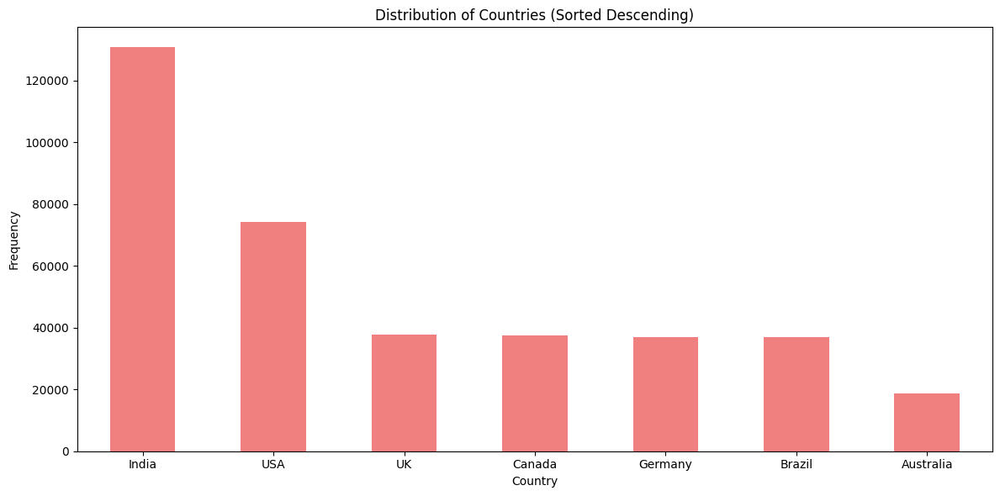

In [11]:
# Histogram of country distribution
country_counts = df['country'].value_counts().sort_values(ascending=False)

plt.figure(figsize=(12,6))

country_counts.plot(kind='bar', color='lightcoral')

plt.title("Distribution of Countries (Sorted Descending)")
plt.xlabel("Country")
plt.ylabel("Frequency")

plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

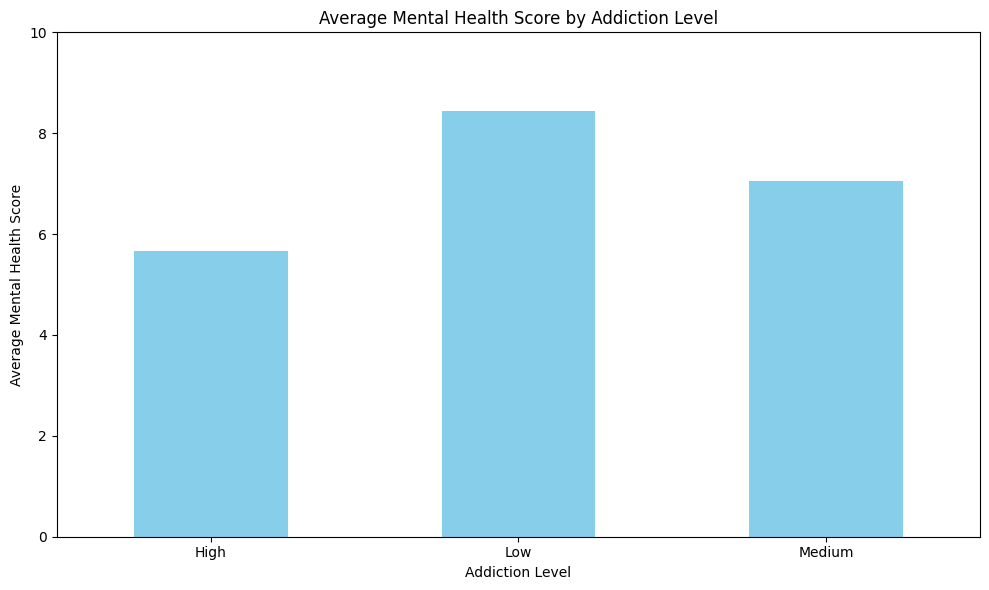

In [12]:
# Plot average mental health score based on addiction level
mean_mental_health = df.groupby('addiction_level')['mental_health_score'].mean()

plt.figure(figsize=(10, 6))
mean_mental_health.plot(kind='bar', color='skyblue')

plt.title("Average Mental Health Score by Addiction Level")
plt.xlabel("Addiction Level")
plt.ylabel("Average Mental Health Score")

plt.ylim(0, 10)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

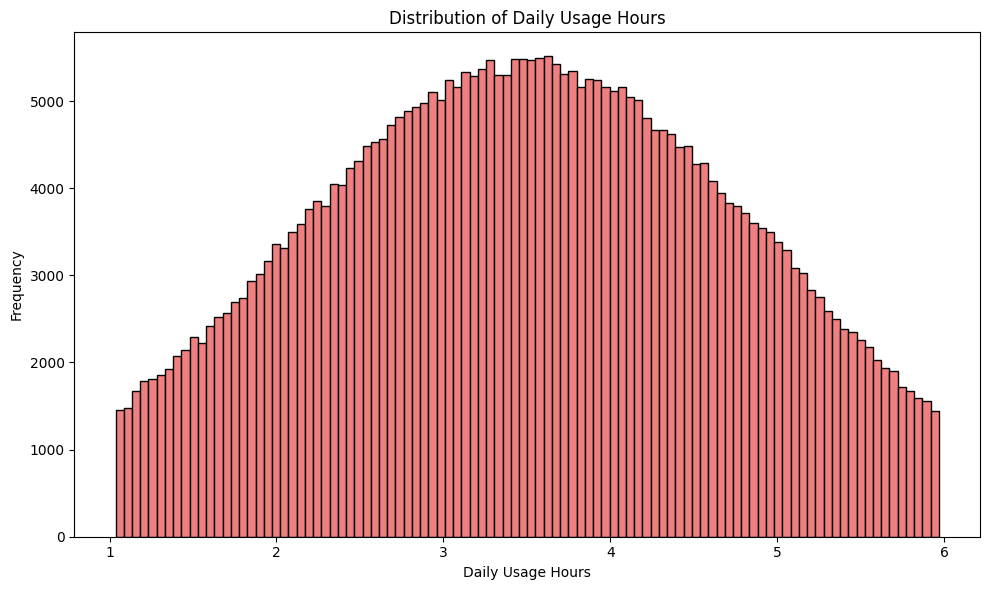

In [13]:
# Histogram of daily usage hours
plt.figure(figsize=(10, 6))
plt.title("Distribution of Daily Usage Hours")
plt.xlabel("Daily Usage Hours")
plt.ylabel("Frequency")
plt.hist(df['daily_usage_hours'], bins=100, color='lightcoral', edgecolor='black')
plt.tight_layout()
plt.show()

In [14]:
# Analysis of the filtered data using Pearson correlation coefficient
correlation_matrix = df.corr(numeric_only=True)
print("Correlation matrix: \n", correlation_matrix)

Correlation matrix: 
                                age  daily_usage_hours  num_platforms_used  \
age                       1.000000           0.000062           -0.000087   
daily_usage_hours         0.000062           1.000000           -0.001351   
num_platforms_used       -0.000087          -0.001351            1.000000   
avg_session_minutes      -0.001051           0.001149            0.002255   
night_usage               0.000725           0.000260           -0.000263   
mental_health_score      -0.002353          -0.687208            0.000453   
screen_time_before_sleep -0.000129          -0.003086           -0.000517   
addiction_number          0.000606           0.863505           -0.001977   
usage_intensity          -0.000303           0.450219           -0.763685   
addiction_risk            0.001283           0.595224           -0.001425   
addiction_risk_score      0.000606           0.863505           -0.001977   

                          avg_session_minutes  night_

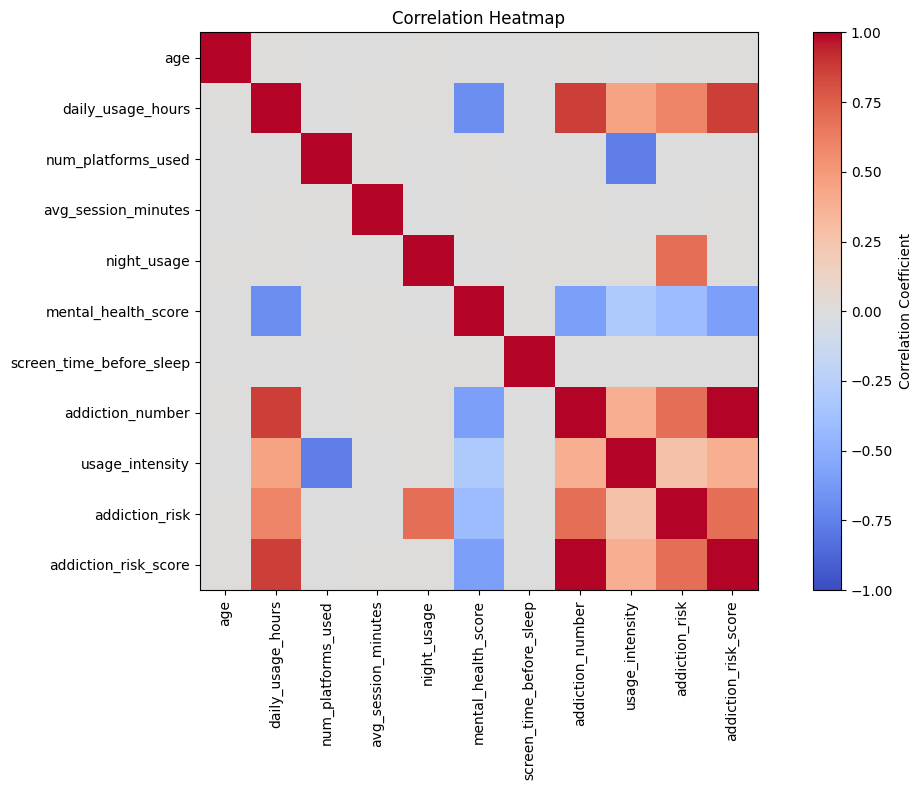

In [15]:
# Correlation heatmap
plt.figure(figsize=(12, 8))
plt.title("Correlation Heatmap")
plt.imshow(correlation_matrix, cmap='coolwarm', vmin=-1, vmax=1)
plt.colorbar(label='Correlation Coefficient')
plt.xticks(range(len(correlation_matrix.columns)), correlation_matrix.columns, rotation=90)
plt.yticks(range(len(correlation_matrix.columns)), correlation_matrix.columns)
plt.tight_layout()
plt.show()

In [16]:
# categorical columns
categorical_columns = [
    'gender',
    'country',
    'primary_platform',
    'purpose',
    'addiction_level'
]

# Chi-square test for independence between all pairs of categorical variables
results = []

# loop through all pairs
for i in range(len(categorical_columns)):
    for j in range(i + 1, len(categorical_columns)):
        table = pd.crosstab(df[categorical_columns[i]], df[categorical_columns[j]])
        chi2, p, dof, expected = chi2_contingency(table)
        msg = "Not significant (p>0.05)"
        if p < 0.05:
            msg = "Significant (p<0.05)"
        results.append(
            {
                'Var1': categorical_columns[i],
                'Var2': categorical_columns[j],
                'Chi2': chi2,
                'p-value': p,
                'Significance': msg
            }
        )

# convert to DataFrame
results_df = pd.DataFrame(results)

# print(results_df.sort_values('p-value'))
print(results_df.sort_values('p-value'))

               Var1              Var2       Chi2   p-value  \
0            gender           country  11.239162  0.081260   
8  primary_platform   addiction_level  12.388268  0.134703   
2            gender           purpose   4.039709  0.400658   
9           purpose   addiction_level   6.605741  0.579704   
7  primary_platform           purpose  14.099713  0.591285   
5           country           purpose  21.130064  0.631041   
6           country   addiction_level   9.753780  0.637551   
4           country  primary_platform  19.269277  0.737481   
1            gender  primary_platform   1.420984  0.840540   
3            gender   addiction_level   0.131377  0.936423   

               Significance  
0  Not significant (p>0.05)  
8  Not significant (p>0.05)  
2  Not significant (p>0.05)  
9  Not significant (p>0.05)  
7  Not significant (p>0.05)  
5  Not significant (p>0.05)  
6  Not significant (p>0.05)  
4  Not significant (p>0.05)  
1  Not significant (p>0.05)  
3  Not significan

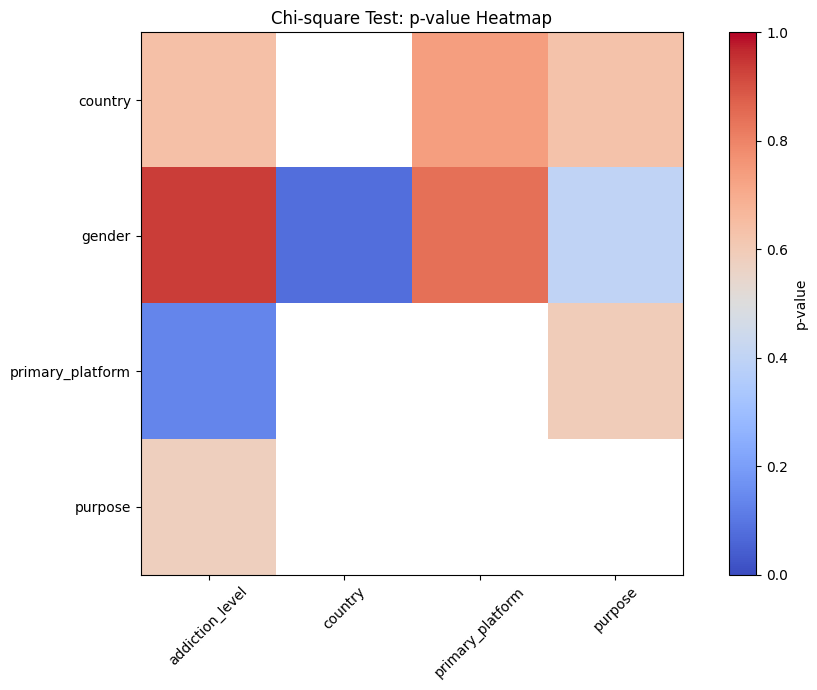

In [17]:
# pivot table from results_df
heatmap_data = results_df.pivot(index='Var1', columns='Var2', values='p-value')

plt.figure(figsize=(10, 7))
plt.title("Chi-square Test: p-value Heatmap")

plt.imshow(heatmap_data, cmap='coolwarm', vmin=0, vmax=1)

plt.colorbar(label='p-value')

plt.xticks(range(len(heatmap_data.columns)), heatmap_data.columns, rotation=45)
plt.yticks(range(len(heatmap_data.index)), heatmap_data.index)

plt.tight_layout()
plt.show()

In [18]:
numeric_cols = df.select_dtypes(include='number').columns
categorical_cols = df.select_dtypes(include='object').columns

results = []

for cat in categorical_cols:
    for num in numeric_cols:
        
        groups = df.groupby(cat)[num].apply(list)
        
        # skip if less than 2 groups
        if len(groups) < 2:
            continue
        
        f_stat, p_value = f_oneway(*groups)
        
        results.append({
            'Categorical Column': cat,
            'Numeric Column': num,
            'F-stat': f_stat,
            'p-value': p_value,
            'Significance': 'Significant (p<0.05)' if p_value < 0.05 else 'Not significant'
        })

anova_results = pd.DataFrame(results)

print(anova_results.sort_values('p-value'))

C:\Users\unknown\AppData\Local\Temp\ipykernel_14904\4177452550.py:2: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  categorical_cols = df.select_dtypes(include='object').columns


   Categorical Column            Numeric Column        F-stat   p-value  \
54    addiction_level      addiction_risk_score           inf  0.000000   
51    addiction_level          addiction_number           inf  0.000000   
49    addiction_level       mental_health_score  1.013085e+05  0.000000   
52    addiction_level           usage_intensity  3.315762e+04  0.000000   
53    addiction_level            addiction_risk  1.688169e+05  0.000000   
45    addiction_level         daily_usage_hours  5.467957e+05  0.000000   
24   primary_platform        num_platforms_used  2.734969e+00  0.027250   
27   primary_platform       mental_health_score  2.675409e+00  0.030132   
32   primary_platform      addiction_risk_score  2.307651e+00  0.055589   
29   primary_platform          addiction_number  2.307651e+00  0.055589   
30   primary_platform           usage_intensity  2.207101e+00  0.065537   
33            purpose                       age  2.114401e+00  0.076185   
37            purpose    

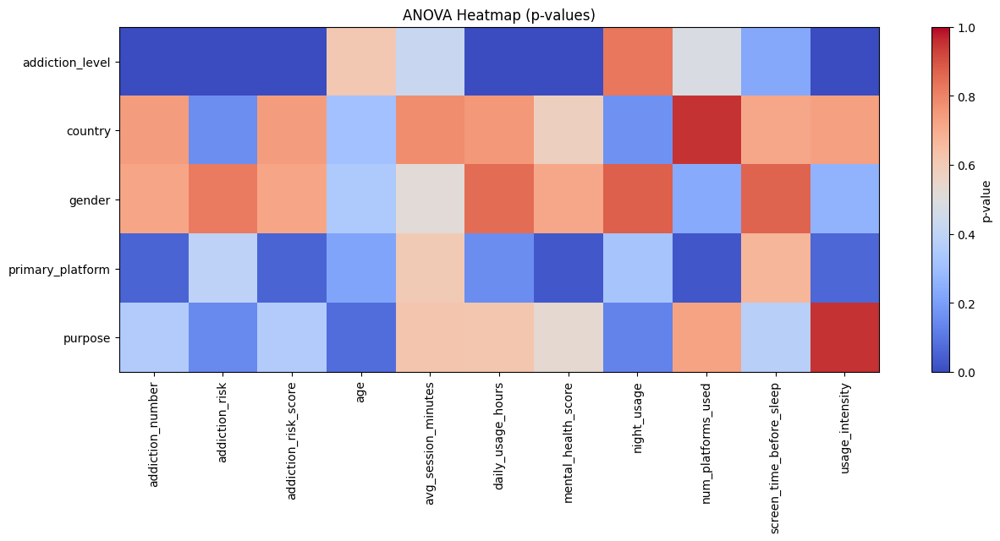

In [19]:
heatmap_data = anova_results.pivot(
    index='Categorical Column',
    columns='Numeric Column',
    values='p-value'
)

plt.figure(figsize=(14, 6))
plt.title("ANOVA Heatmap (p-values)")

plt.imshow(heatmap_data, cmap='coolwarm', vmin=0, vmax=1)

plt.colorbar(label='p-value')

plt.xticks(range(len(heatmap_data.columns)), heatmap_data.columns, rotation=90)
plt.yticks(range(len(heatmap_data.index)), heatmap_data.index)

plt.tight_layout()
plt.show()